# Stock Analysis

#### <font color = 'red'>USER INPUT</font>

In [1]:
stock_ticker = "NIFTY IT"            #Change ticker name here and re-run the notebook
ema          = (30,60,200)           #Set periods for Exponentail Moving Average
focus_period = 1000                  #Filter period for focus. If set only last 150 trading days data will be shown for analysis.

**Installing Package**

In [2]:
# Install package
%pip install --upgrade git+git://github.com/rahulspsec/portfoliotools.git

  Cloning git://github.com/rahulspsec/portfoliotools.git to /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-8f6iothd
  Running command git clone -q git://github.com/rahulspsec/portfoliotools.git /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-8f6iothd
  Found existing installation: portfoliotools 0.0.1
    Uninstalling portfoliotools-0.0.1:
      Successfully uninstalled portfoliotools-0.0.1
  Running setup.py install for portfoliotools ... done
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
from portfoliotools.screener.stock_detail import StockDetail
from portfoliotools.screener.stock_fundamentals import StockFundamentals
#from portfoliotools.screener.screener_pattern import CandleStickPatters
from portfoliotools.screener.utility.util import NumToStr, flatten_dicts_of_dicts, backTestStrategy, slope, get_arima_predictions
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
import nsetools

import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

nse = nsetools.Nse()
if not nse.is_valid_code(stock_ticker) and "NIFTY" not in stock_ticker:
    raise(Exception("Not a Valid Ticker"))
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
stockObj = StockDetail(stock_ticker, period = 2000)
stock_funda = StockFundamentals(stock_ticker)
details = stockObj.details()
details_funda = stock_funda.get_details_info()

ERROR:root:Error fetching 52 week high - NIFTY IT
ERROR:root:Error fetching 52 week low - NIFTY IT
ERROR:root:Error fetching 52 week low - NIFTY IT
ERROR:root:Error fetching 52 week high - NIFTY IT
ERROR:root:Error fetching 52 week low - NIFTY IT
ERROR:root:Error fetching 52 week low - NIFTY IT
ERROR:root:Error fetching 52 week high - NIFTY IT
ERROR:root:Error fetching 52 week low - NIFTY IT
ERROR:root:Error calculating ATR Results - NIFTY IT
ERROR:root:Error calculating Renko Results - NIFTY IT
ERROR:root:'EBITDA'
ERROR:root:Error calculating derived info NIFTY IT
ERROR:root:'EBITDA'
ERROR:root:Error calculating derived info NIFTY IT


### <font color = "red">Overview</font>

In [5]:
info = details['Overview']['Info']
df1 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Overview'])
info = details['Overview']['52W Statistics']
df2 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['52W Stats'])
info = details['Overview']['Returns']
df3 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Return Stats'])
info = flatten_dicts_of_dicts(details['Technical Analytics'])
df5 = pd.DataFrame( data = info.values(), index = np.array(list(info.keys())), columns = ['Technical Signals'])
cols = [col for col in df5.index.tolist() if 'Signal' in col]
df5 = df5.loc[cols,:]
display_side_by_side(df1,df2,df3,df5)

,Overview
Stock Name,NIFTY IT
Date,27Mar20
Last Close,12535.6
Last COB,26Mar20
Average Volume,21865208.88
Standard Deviation,219.45
CAGR,1.71
Annual Volatility,19.16
Sharpe,-0.093
Sortino,-0.118


## <font color = "red">Technical Analysis</font>

In [6]:
data = stockObj.generate_moving_averages(exponential=ema)
data = data.tail(focus_period) # last 150 periods

### - Close Price vs Volumne

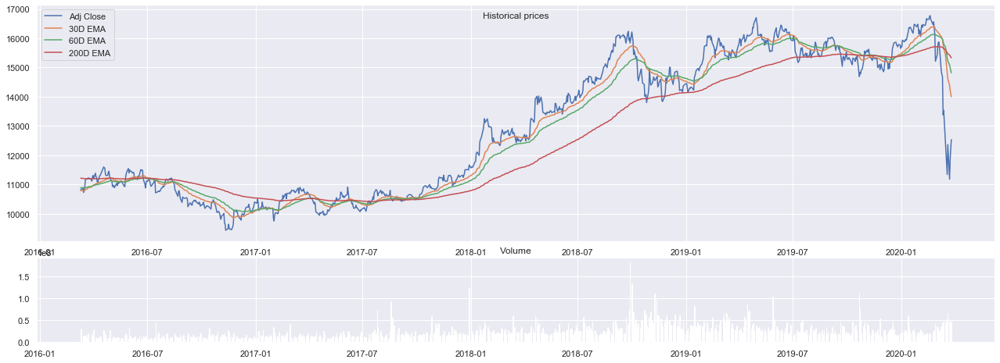

In [7]:
# Adjusted Close & Volumne - Historical
fig = plt.figure(figsize = (17,6))
fig.suptitle("Historical prices")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for period in ema:
    col = '{0}D Exponential Moving Average'.format(period)
    label = '{0}D EMA'.format(period)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']#np.log10(data['Volume'])
#vol_cmap = data['Volume'].apply(lambda x, vol: 'rgb(250,0,0)' if x<vol else 'rgb(0,250,0)',vol = vol.mean())
ax2.bar(data.index, vol)
#ax2.set_ylim([vol.min()-.5, vol.max() + .5])
#ax2.plot(data.index, [vol.mean()]*len(vol), color = vol_cmap.tolist())
plt.show()

### Bollinger Bands

In [8]:
data = stockObj.get_bollinger_details().tail(focus_period)

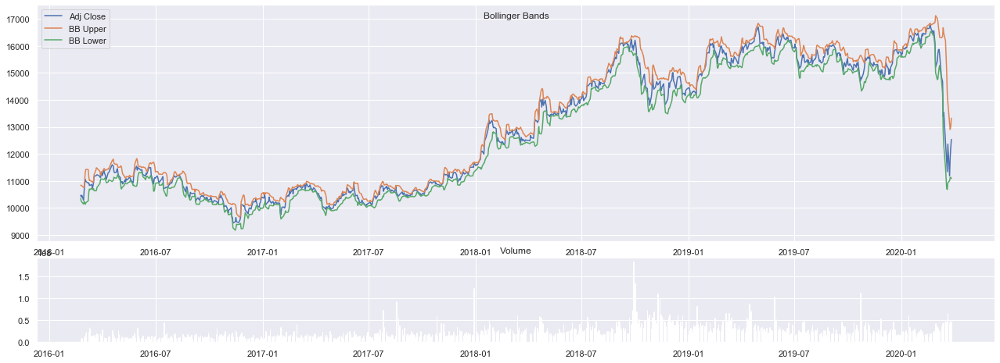

In [9]:
fig = plt.figure(figsize = (17,6))
fig.suptitle("Bollinger Bands")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for part in ['Upper', 'Lower']:
    col = 'Bollinger Band {0}'.format(part)
    label = 'BB {0}'.format(part)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']
ax2.bar(data.index, vol)
plt.show()

### - Close Price Candle Stick

In [10]:
## Candle Stick - Historical
fig = go.Figure(data=[go.Candlestick(x=data.index,
                       open=data['Open'], high=data['High'],
                       low=data['Low'], close=data['Close'])])
#fig.layout.xaxis.type = 'category'
fig.show()

### - Williams R
**Description:** %D is 5 day smooth average of %R. Buy signal is triggered when %D is less than -75 and volume is more than 1.25 times avg 5 day volume. Sell signal is triggered when %D is more than -20 and volume is more than 1.25 times avg 5 day volume.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [11]:
#data = stockObj.get_williams_r_details()[2] # To get williams R data frame
fig = stockObj.plot_williams_r_details(period = focus_period)
fig.show()

### - MACD
**Descrption**: MACD is momentum indicator. MACD Line is EMA(12D) - EMA(26D). MACD Indicator is exponential moving average of MACD.
When MACD Line crosses MACD Indicator from top, it's a BUY zone. When MACD Line crosses MACD Indicator from below, it's a SELL zone. BUY signal is generated when BUY Zone creates a maxima based on 9 day period. SELL signal is generated when SELL Zone creates a maxima.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [12]:
fig = stockObj.plot_macd_details(period = focus_period)
fig.show()

### - RSI
**Descrption**: Relative Stregth Index(RSI) is momentum indicator. Relative Strength is calculated as ration of Average Gains to Average Loss. RS is then indexed to calculate RSI.

**Formula:** RS = Avg Gain/Avg Loss; 
RSI = 100 - 100/(1+RS)

Buy signal is given when RSI < 30.
Sell signal is given when RSI > 70.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [13]:
fig = stockObj.plot_rsi_details(period = focus_period)
fig.show()

### - OBV
**Description:** OBV is a momentum indicator. BUY signal is triggered when OBV Index is less than 0 and rate of OBV Index change is more than 60. SELL signal is triggered when OBV Index is more than 0 and rate of OBV Index change is more than 60.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [14]:
fig = stockObj.plot_obv_details(period = focus_period)
fig.show()

### ADX/ATR
**Description:**

**ADX Value  	        Trend Strength**

0-25	                Absent or Weak Trend

25-50	                Strong Trend

50-75	                Very Strong Trend

75-100	                Extremely Strong Trend


In [15]:
data = stockObj.get_adx_details()
data = data.join(stockObj.get_atr_details()['ATR'])
data.dropna(inplace = True)
data = data.tail(focus_period)

In [16]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes= True, vertical_spacing = 0.08, 
    column_widths = [15], row_heights = [2,2,2],
    specs=[[{"secondary_y": True}], [{"secondary_y": False}], [{"secondary_y": False}]])

hovertext      = ["<br>Close : " + "{:,}".format(np.round(txt['Close'],2)) + 
                    "<br>High: " + "{:,}".format(np.round(txt['High'],2)) + 
                    "<br>Low: " + "{:,}".format(np.round(txt['Low'],2)) + 
                    "<br>Volume: " + "{:,}".format(txt['Volume']) + 
                    "<br>ATR: " + "{:,}".format(np.round(txt['ATR'],2)) +
                    "<br>ADX: " + "{:,}".format(np.round(txt['ADX'],2))
                    for txt in data.to_dict(orient = "records")]
# Add Close Price
fig.add_trace(
go.Scatter(x=data.index, y=data['Close'], name="Close", text = hovertext, line = {'color':'purple'}), row = 2, col =1,
)
# Add ADX
fig.add_trace(
go.Scatter(x=data.index, y=data['ADX'], name="ADX", text = hovertext, line = {'color':'darkgray'}), row = 1, col =1,
)
# Add ATR
fig.add_trace(
go.Scatter(x=data.index, y=data['ATR'], name="ATR", text = hovertext, line = {'color':'black'}), row = 1, col =1,
secondary_y = True)                                                       
# Add Volume
fig.add_trace(
go.Scatter(x=data.index, y=data['Volume'], name="Volume", text = hovertext, line = {'color':'black'}), row = 3, col =1,
)
fig['layout']['yaxis1'].update(title='ADX')
fig['layout']['yaxis2'].update(title='ATR')
fig['layout']['yaxis3'].update(title='Close')
fig['layout']['yaxis4'].update(title='Volume')
fig.show()

### Combined Analysis

In [17]:
combined_analysis = stockObj.technical_details
combined_analysis.dropna()

Prices                                                           \
                Open      High       Low     Close       Volume      Turnover   
Date                                                                            
2014-10-23  10776.00  10787.25  10757.90  10781.20    2415911.0  1.907200e+09   
2014-10-27  10890.60  10890.60  10684.60  10714.30   11428935.0  1.355980e+10   
2014-10-28  10696.30  10771.55  10696.30  10737.25   10718895.0  1.433230e+10   
2014-10-29  10767.40  10929.15  10767.40  10912.30   13344455.0  1.641470e+10   
2014-10-30  10973.35  11190.90  10973.35  11124.60   20114568.0  2.724130e+10   
2014-10-31  11192.80  11372.25  11192.80  11341.05   11154328.0  1.456510e+10   
2014-11-12  11428.40  11508.75  11406.75  11421.30   10451577.0  1.043860e+10   
2014-11-13  11458.30  11575.50  11398.70  11539.60   15450746.0  1.079280e+10   
2014-11-14  11551.40  11614.65  11549.60  11571.75   12393079.0  1.039600e+10   
2014-11-17  11553.90  11623.55  11496.60  11608.15    9099326.0  9.687900e+09   
2014-11-18  11628.15  11633.40  11495.05  11512.90   10016275.0  9.420400e+09   
2014-11-19  11532.00  11556.35  11444.65  11524.30   10722668.0  1.052700e+10   
2014-11-20  11583.45  11692.40  11538.20  11677.45    9915776.0  1.139070e+10   
2014-11-21  11637.70  11643.70  11544.35  11596.95   10600459.0  1.422080e+10   
2014-11-24  11659.70  11825.85  11659.70  11809.85    9644945.0  1.390300e+10   
2014-11-25  11847.40  11908.10  11679.10  11790.00   14405769.0  1.876430e+10   
2014-11-26  11769.20  11804.75  11714.85  11770.40    7782652.0  1.088580e+10   
2014-11-27  11800.85  11925.90  11799.80  11900.85   11852273.0  1.745760e+10   
2014-11-28  11925.85  11979.50  11874.80  11898.05    9556642.0  1.515110e+10   
2014-12-01  11942.25  12013.90  11884.95  11981.00   11764294.0  1.854210e+10   
2014-12-02  11952.70  11952.70  11794.45  11812.75    8096650.0  1.105000e+10   
2014-12-03  11787.60  11819.70  11707.25  11807.90   10852872.0  1.539450e+10   
2014-12-04  11809.55  11895.15  11732.25  11748.75   20508085.0  1.343460e+10   
2014-12-05  11788.55  11789.85  11506.55  11536.25   11840650.0  1.269740e+10   
2014-12-08  11417.10  11427.90  11136.25  11176.45   50068261.0  9.159240e+10   
2014-12-09  11207.60  11271.50  11127.75  11138.90   10959420.0  1.334710e+10   
2014-12-10  11137.55  11195.75  11102.75  11111.70    8570910.0  1.046190e+10   
2014-12-11  11059.70  11088.30  10971.50  10986.25    9253392.0  1.094750e+10   
2014-12-12  11030.15  11121.10  10869.25  10929.90   15656104.0  1.563480e+10   
2014-12-15  10748.50  10830.75  10690.85  10727.75   14881356.0  1.683300e+10   
2014-12-16  10694.25  10972.65  10694.25  10891.60   16701621.0  1.973730e+10   
2014-12-17  10894.30  10951.25  10706.00  10860.10   15394822.0  1.732080e+10   
2014-12-18  10920.65  10997.45  10872.15  10987.45   13944917.0  1.636610e+10   
2014-12-19  11101.60  11220.35  11101.60  11176.20   16577003.0  1.715200e+10   
2014-12-22  11223.75  11223.75  11088.95  11202.10   11790928.0  1.131760e+10   
2014-12-23  11184.95  11260.10  11065.15  11094.60    9090260.0  1.010040e+10   
2014-12-24  11104.05  11119.55  10889.00  10928.00   17225296.0  2.518260e+10   
2014-12-26  10974.85  11046.65  10916.95  11036.70    6042619.0  4.839400e+09   
2014-12-29  11056.20  11154.45  11056.20  11104.70    7052932.0  5.283700e+09   
2014-12-30  11113.35  11186.85  11113.05  11149.70    6728595.0  5.970500e+09   
2014-12-31  11129.55  11237.65  11106.95  11216.30    8104426.0  9.337500e+09   
2015-01-01  11214.80  11235.75  11166.35  11215.70    4246150.0  3.575100e+09   
2015-01-02  11214.65  11399.10  11214.65  11372.10   10004862.0  9.645600e+09   
2015-01-05  11369.35  11433.75  11186.95  11248.55    8858018.0  1.059000e+10   
2015-01-06  11186.10  11186.10  10909.00  10959.90   12515739.0  1.364500e+10   
2015-01-07  11013.20  11042.35  10889.55  10916.00   10976356.0  1.203440e+10   
2015-01-08  11031.15  11058.15  10915.05  110

## <font color = "red">Predictions </font>

### ARIMA

,MSE,SMAPE KUN,Pred Value,Pred Low 5%,Pred High 5%
0,51434.958,4.92,[12693.11],12393.33,12992.89


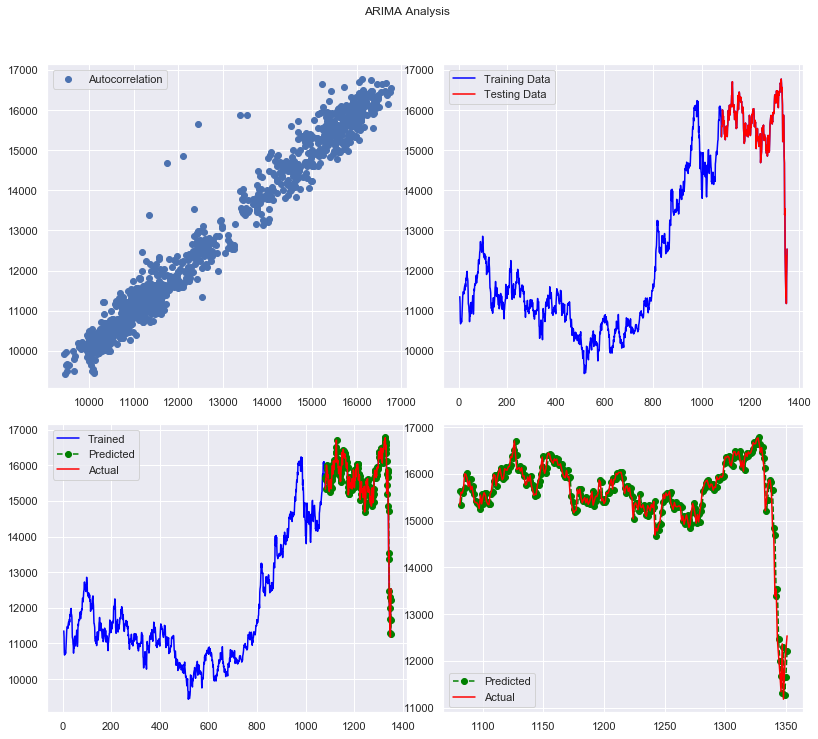

In [18]:
data = stockObj.historical_prices['Close'].values
result = get_arima_predictions(data, plot = True)
pd.DataFrame([result[0]])